> # **Proyecto Predicción fuga de clientes**


Ricardo Bautista

 **Librerías**


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import seaborn as sns
plt.style.use('ggplot')
from imblearn.combine import SMOTETomek
import geopandas as gpd

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedKFold

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
import xgboost as xgb
from sklearn.neural_network import MLPClassifier

from statsmodels.stats.outliers_influence import variance_inflation_factor

import os
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score,roc_curve

from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

import shap

import pickle

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 6)

pd.set_option('display.float_format', lambda x: '%.3f' % x)

## Carga de Datos

El dataset se compone de 5 tablas, cada una con información distinta de clientes o de las locaciones

In [3]:
df_demographics = pd.read_excel('data/Telco_customer_churn_demographics.xlsx')
df_locations = pd.read_excel('data/Telco_customer_churn_location.xlsx')
df_population = pd.read_excel('data/Telco_customer_churn_population.xlsx')
df_services = pd.read_excel('data/Telco_customer_churn_services.xlsx')
df_status = pd.read_excel('data/Telco_customer_churn_status.xlsx')

### Demografía

In [4]:
df_demographics.head()

,Customer ID,Count,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents
0,8779-QRDMV,1,Male,78,No,Yes,No,No,0
1,7495-OOKFY,1,Female,74,No,Yes,Yes,Yes,1
2,1658-BYGOY,1,Male,71,No,Yes,No,Yes,3
3,4598-XLKNJ,1,Female,78,No,Yes,Yes,Yes,1
4,4846-WHAFZ,1,Female,80,No,Yes,Yes,Yes,1


In [5]:
df_demographics.shape

(7043, 9)

### Ubicación

In [6]:
df_locations.head()

,Customer ID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude
0,8779-QRDMV,1,United States,California,Los Angeles,90022,"34.02381, -118.156582",34.024,-118.157
1,7495-OOKFY,1,United States,California,Los Angeles,90063,"34.044271, -118.185237",34.044,-118.185
2,1658-BYGOY,1,United States,California,Los Angeles,90065,"34.108833, -118.229715",34.109,-118.230
3,4598-XLKNJ,1,United States,California,Inglewood,90303,"33.936291, -118.332639",33.936,-118.333
4,4846-WHAFZ,1,United States,California,Whittier,90602,"33.972119, -118.020188",33.972,-118.020


In [7]:
df_locations.shape

(7043, 9)

### Población

In [8]:
df_population.head()

,ID,Zip Code,Population
0,1,90001,54492
1,2,90002,44586
2,3,90003,58198
3,4,90004,67852
4,5,90005,43019


In [9]:
df_population.shape

(1671, 3)

### Servicios

In [10]:
df_services.head()

,Customer ID,Count,Quarter,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
0,8779-QRDMV,1,Q3,No,0,1,None,No,0.000,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.650,39.650,0.000,20,0.000,59.650
1,7495-OOKFY,1,Q3,Yes,1,8,Offer E,Yes,48.850,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.650,633.300,0.000,0,390.800,1024.100
2,1658-BYGOY,1,Q3,No,0,18,Offer D,Yes,11.330,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.450,1752.550,45.610,0,203.940,1910.880
3,4598-XLKNJ,1,Q3,Yes,1,25,Offer C,Yes,19.760,No,Yes,Fiber Optic,12,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.500,2514.500,13.430,0,494.000,2995.070
4,4846-WHAFZ,1,Q3,Yes,1,37,Offer C,Yes,6.330,Yes,Yes,Fiber Optic,14,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,76.500,2868.150,0.000,0,234.210,3102.360


In [11]:
df_services.shape

(7043, 30)

### Status

In [12]:
df_status.head()

,Customer ID,Count,Quarter,Satisfaction Score,Customer Status,Churn Label,Churn Value,Churn Score,CLTV,Churn Category,Churn Reason
0,8779-QRDMV,1,Q3,3,Churned,Yes,1,91,5433,Competitor,Competitor offered more data
1,7495-OOKFY,1,Q3,3,Churned,Yes,1,69,5302,Competitor,Competitor made better offer
2,1658-BYGOY,1,Q3,2,Churned,Yes,1,81,3179,Competitor,Competitor made better offer
3,4598-XLKNJ,1,Q3,2,Churned,Yes,1,88,5337,Dissatisfaction,Limited range of services
4,4846-WHAFZ,1,Q3,2,Churned,Yes,1,67,2793,Price,Extra data charges


In [13]:
df_status.shape

(7043, 11)

### Merging de bases

Revisamos que los ID y filas sean iguales 

In [14]:
(df_status['Customer ID'] == df_demographics['Customer ID']).all()

True

In [15]:
df_status.shape, df_demographics.shape

((7043, 11), (7043, 9))

Se hace un merge 'inner' con key 'Customer ID' de la base Status con la de Demografía

In [16]:
df_final = df_status.merge(df_demographics.drop(columns=['Count']), on='Customer ID', how='inner')

In [17]:
df_final.shape, df_locations.shape

((7043, 18), (7043, 9))

Revisamos que los ID y filas sean iguales 

In [18]:
(df_final['Customer ID'] == df_locations['Customer ID']).all()

True

Se hace un merge 'inner' con key 'Customer ID' de la base mergeada anterior con la base de Ubicación

In [19]:
df_final = df_final.merge(df_locations.drop(columns=['Count']), on='Customer ID', how='inner')

In [20]:
df_final.shape, df_population.shape

((7043, 25), (1671, 3))

Se hace un merge 'left' con key 'Zip Code' de la base mergeada anterior con la base de Población

In [21]:
df_final = df_final.merge(df_population.drop(columns=['ID']), on='Zip Code', how='left')

In [22]:
df_final.shape, df_services.shape

((7043, 26), (7043, 30))

In [23]:
(df_final['Customer ID'] == df_services['Customer ID']).all()

True

Se hace un merge 'inner' con key 'Customer ID' de la base mergeada anterior con la base de Servicios (se dropean count y quarter para que no repetir columnas)

In [24]:
df_final = df_final.merge(df_services.drop(columns=['Count','Quarter']), on='Customer ID', how='inner')

Se dropean las columnas Zip Code y Count debido a que no son importantes para nuestro análisis

Por otro lado, 'Churn Score' es un valor calculado por IBM SPSS Modeler. La idea del proyecto es generar esto y tomarlo como variable predictora podría sesgar los resultados.

In [25]:
df_final = df_final.drop(columns=['Zip Code','Count','Churn Score'])

In [26]:
df_final = df_final.set_index('Customer ID')

### Base Final

In [27]:
df_final.head()

,Quarter,Satisfaction Score,Customer Status,Churn Label,Churn Value,CLTV,Churn Category,Churn Reason,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,Country,State,City,Lat Long,Latitude,Longitude,Population,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
Customer ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8779-QRDMV,Q3,3,Churned,Yes,1,5433,Competitor,Competitor offered more data,Male,78,No,Yes,No,No,0,United States,California,Los Angeles,"34.02381, -118.156582",34.024,-118.157,68701,No,0,1,None,No,0.000,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.650,39.650,0.000,20,0.000,59.650
7495-OOKFY,Q3,3,Churned,Yes,1,5302,Competitor,Competitor made better offer,Female,74,No,Yes,Yes,Yes,1,United States,California,Los Angeles,"34.044271, -118.185237",34.044,-118.185,55668,Yes,1,8,Offer E,Yes,48.850,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.650,633.300,0.000,0,390.800,1024.100
1658-BYGOY,Q3,2,Churned,Yes,1,3179,Competitor,Competitor made better offer,Male,71,No,Yes,No,Yes,3,United States,California,Los Angeles,"34.108833, -118.229715",34.109,-118.230,47534,No,0,18,Offer D,Yes,11.330,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.450,1752.550,45.610,0,203.940,1910.880
4598-XLKNJ,Q3,2,Churned,Yes,1,5337,Dissatisfaction,Limited range of services,Female,78,No,Yes,Yes,Yes,1,United States,California,Inglewood,"33.936291, -118.332639",33.936,-118.333,27778,Yes,1,25,Offer C,Yes,19.760,No,Yes,Fiber Optic,12,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.500,2514.500,13.430,0,494.000,2995.070
4846-WHAFZ,Q3,2,Churned,Yes,1,2793,Price,Extra data charges,Female,80,No,Yes,Yes,Yes,1,United States,California,Whittier,"33.972119, -118.020188",33.972,-118.020,26265,Yes,1,37,Offer C,Yes,6.330,Yes,Yes,Fiber Optic,14,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,76.500,2868.150,0.000,0,234.210,3102.360


In [28]:
df_final.shape

(7043, 49)

Revisando qué columnas contienen solo una categoría para ser dropeadas

In [29]:
df_final['Quarter'].unique()

array(['Q3'], dtype=object)

In [30]:
df_final['Country'].unique()

array(['United States'], dtype=object)

In [31]:
df_final['State'].unique()

array(['California'], dtype=object)

In [32]:
df_final['Customer Status'].unique()

array(['Churned', 'Stayed', 'Joined'], dtype=object)

In [33]:
df_final = df_final.drop(columns=['Quarter','Country','State','Customer Status'])

Revisando valores vacíos

In [34]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(df_final.isna().sum())

Satisfaction Score                      0
Churn Label                             0
Churn Value                             0
CLTV                                    0
Churn Category                       5174
Churn Reason                         5174
Gender                                  0
Age                                     0
Under 30                                0
Senior Citizen                          0
Married                                 0
Dependents                              0
Number of Dependents                    0
City                                    0
Lat Long                                0
Latitude                                0
Longitude                               0
Population                              0
Referred a Friend                       0
Number of Referrals                     0
Tenure in Months                        0
Offer                                   0
Phone Service                           0
Avg Monthly Long Distance Charges 

Es normal que las columnas de Churn Category y Churn Reason sean vacías, esto debido a que, como el usuario no ha fugado, no tendría que haber un valor de su razón de fuga.

Igual servirán para nuestro análisis de clientes fugados, pero no para el modelado.

Se separan las bases con comentarios de la final

In [35]:
df_comentarios = df_final.dropna(axis=0)

In [36]:
df_final=df_final.dropna(axis=1)

In [37]:
df_final.describe()

,Satisfaction Score,Churn Value,CLTV,Age,Number of Dependents,Latitude,Longitude,Population,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000,7043.000
mean,3.245,0.265,4400.296,46.510,0.469,36.197,-119.757,22139.603,1.952,32.387,22.959,20.515,64.762,2280.381,1.962,6.861,749.099,3034.379
std,1.202,0.442,1183.057,16.750,0.963,2.469,2.154,21152.393,3.001,24.542,15.448,20.419,30.090,2266.220,7.903,25.105,846.660,2865.205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50%,3.000,0.000,4527.000,46.000,0.000,36.205,-119.595,17554.000,0.000,29.000,22.890,17.000,70.350,1394.550,0.000,0.000,401.440,2108.640
75%,4.000,1.000,5380.500,60.000,0.000,38.161,-117.970,36125.000,3.000,55.000,36.395,27.000,89.850,3786.600,0.000,0.000,1191.100,4801.145
max,5.000,1.000,6500.000,80.000,9.000,41.962,-114.193,105285.000,11.000,72.000,49.990,85.000,118.750,8684.800,49.790,150.000,3564.720,11979.340


In [38]:
df_final.describe(include='object')

,Churn Label,Gender,Under 30,Senior Citizen,Married,Dependents,City,Lat Long,Referred a Friend,Offer,Phone Service,Multiple Lines,Internet Service,Internet Type,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method
count,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043
unique,2,2,2,2,2,2,1106,1679,2,6,2,2,2,4,2,2,2,2,2,2,2,2,3,2,3
top,No,Male,No,No,No,No,Los Angeles,"33.362575, -117.299644",No,None,Yes,No,Yes,Fiber Optic,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal
freq,5174,3555,5642,5901,3641,5416,293,43,3821,3877,6361,4072,5517,3035,5024,4614,4621,4999,4336,4311,4555,4745,3610,4171,3909


## Análisis exploratorio e insights de base de datos

### Todos los clientes

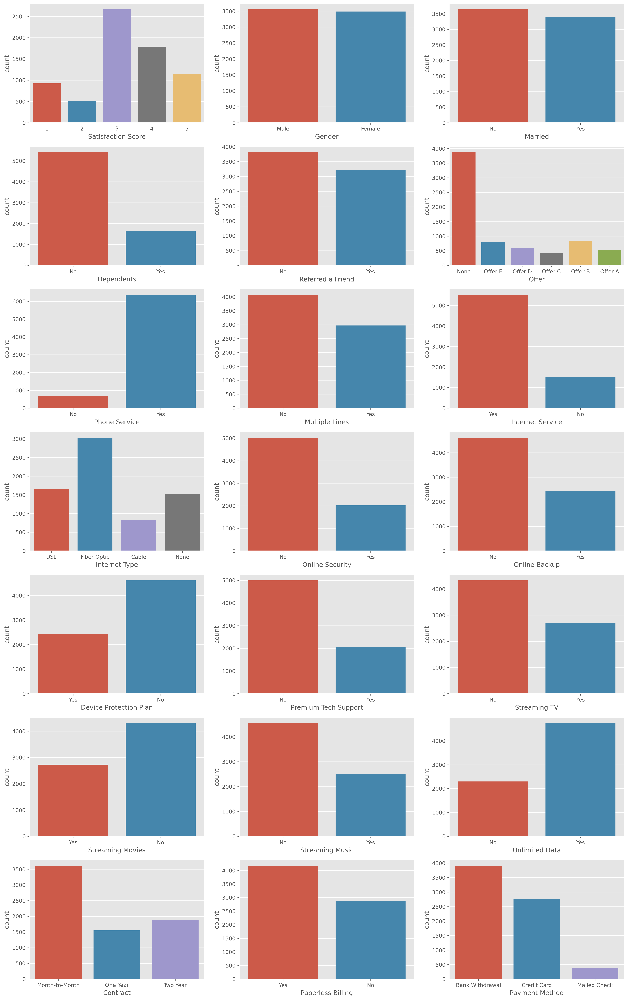

In [39]:
n_rows=7
n_cols=3

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 33), dpi=300)

for i, column in enumerate(['Satisfaction Score',
                            'Gender','Married','Dependents',
                            'Referred a Friend','Offer','Phone Service','Multiple Lines','Internet Service',
                            'Internet Type','Online Security','Online Backup','Device Protection Plan','Premium Tech Support',
                            'Streaming TV','Streaming Movies','Streaming Music','Unlimited Data','Contract','Paperless Billing','Payment Method'
                            
                            ]):
    sns.countplot(data=df_final,ax=axes[i//n_cols,i%n_cols],x=column)

- La mayoría de clientes:
  - Ha puesto un puntaje de satisfacción de 3, seguido por 4
  - No cuenta con dependientes
  - No cuenta con una oferta actualmente
  
- Entre los servicios contratados, los más solicitados son:
  - Servicio telefónico
  - Servicio de internet (especialmente fibra óptica)
  - Servicio de protección de dispostivio

- Es poca la relación de clientes que cuenta con:
  - Sguridad Online
  - Respaldo Online
  - Soporte técnico premium
  - Servicio Streaming por TV

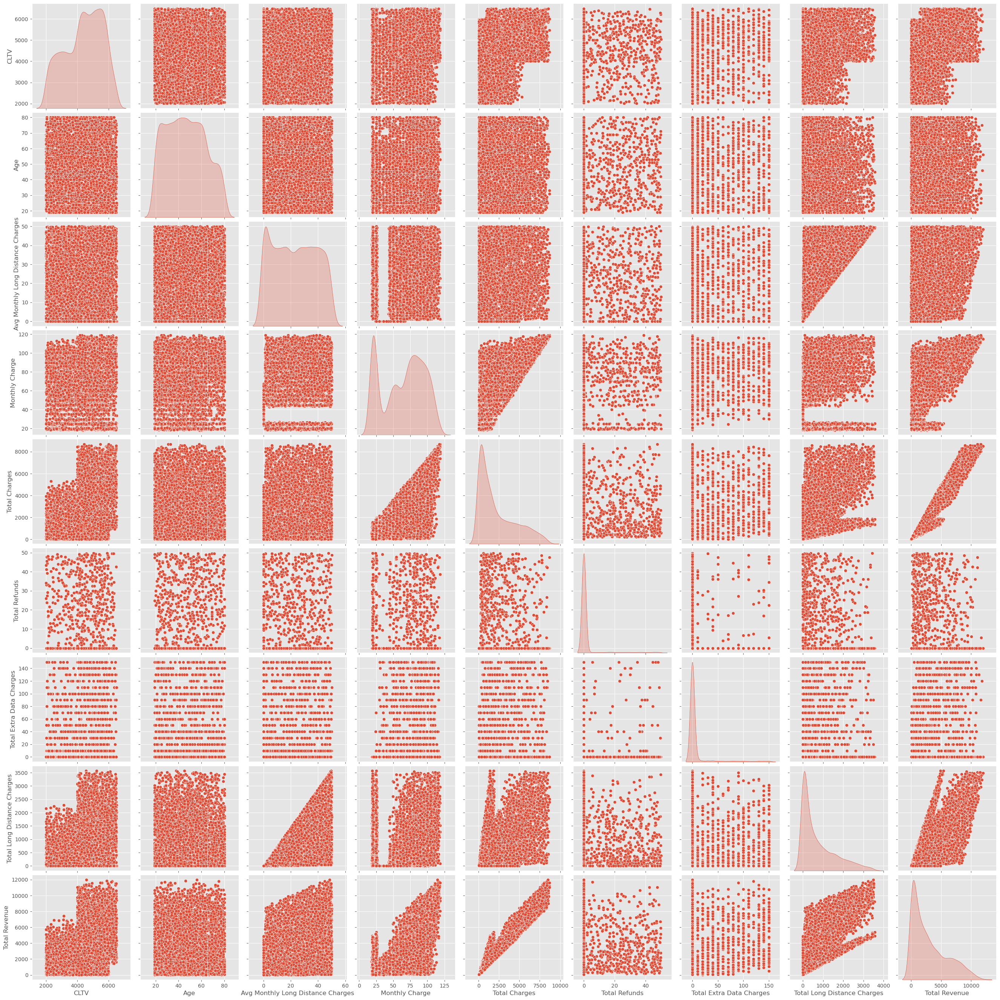

In [40]:
sns.pairplot(df_final[['CLTV','Age','Avg Monthly Long Distance Charges','Monthly Charge','Total Charges','Total Refunds','Total Extra Data Charges','Total Long Distance Charges','Total Revenue']], height=3, diag_kind = 'kde')

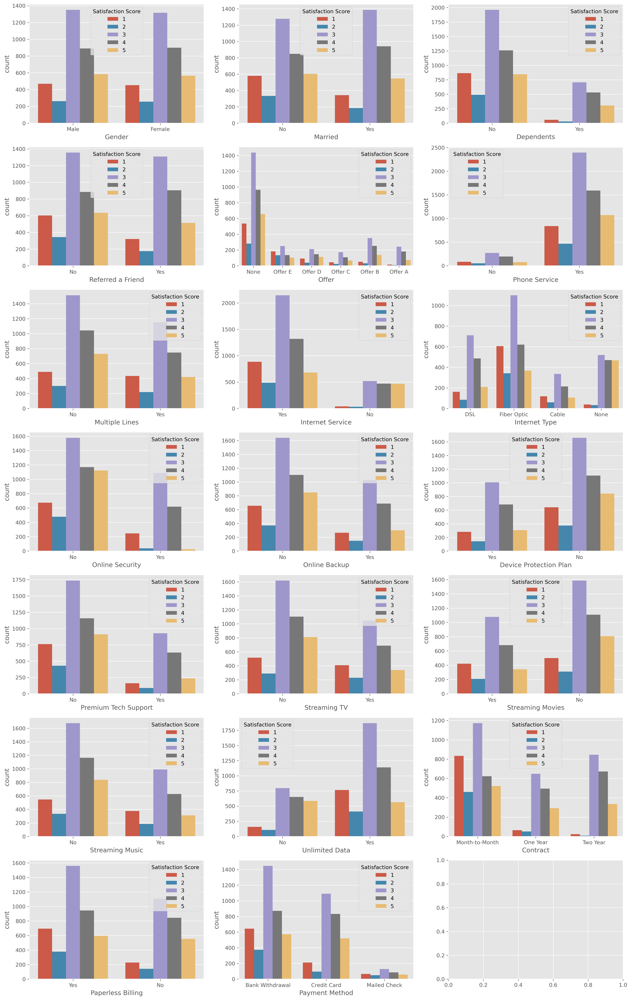

In [41]:
n_rows=7
n_cols=3

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 33), dpi=300)

for i, column in enumerate([
                            'Gender','Married','Dependents',
                            'Referred a Friend','Offer','Phone Service','Multiple Lines','Internet Service',
                            'Internet Type','Online Security','Online Backup','Device Protection Plan','Premium Tech Support',
                            'Streaming TV','Streaming Movies','Streaming Music','Unlimited Data','Contract','Paperless Billing','Payment Method'
                            
                            ]):
    sns.countplot(data=df_final,ax=axes[i//n_cols,i%n_cols],x=column, hue='Satisfaction Score')

- Las ofertas A y B cuentan con una relación de más cantidad de clientes satisfechos (puntaje 4 a más) que insatisfechos(puntaje 3 o menos)
- Pareciera ser que la mayoría de clientes con bajo puntaje se encuentra en Fibra óptica y luego DSL. Por otra parte, fibra óptica también concentra un gran número de clientes con buen puntaje de satisfacción
- La relación de clientes con puntaje bajo respecto a los de puntaje alto se reduce al comparar los gráficos no tener a tener servicios de:
  - Seguridad online, Respaldo online, Servicio de protección de dispositivos y Soporte téncico premium

Gráficos separando por Clientes Fugados

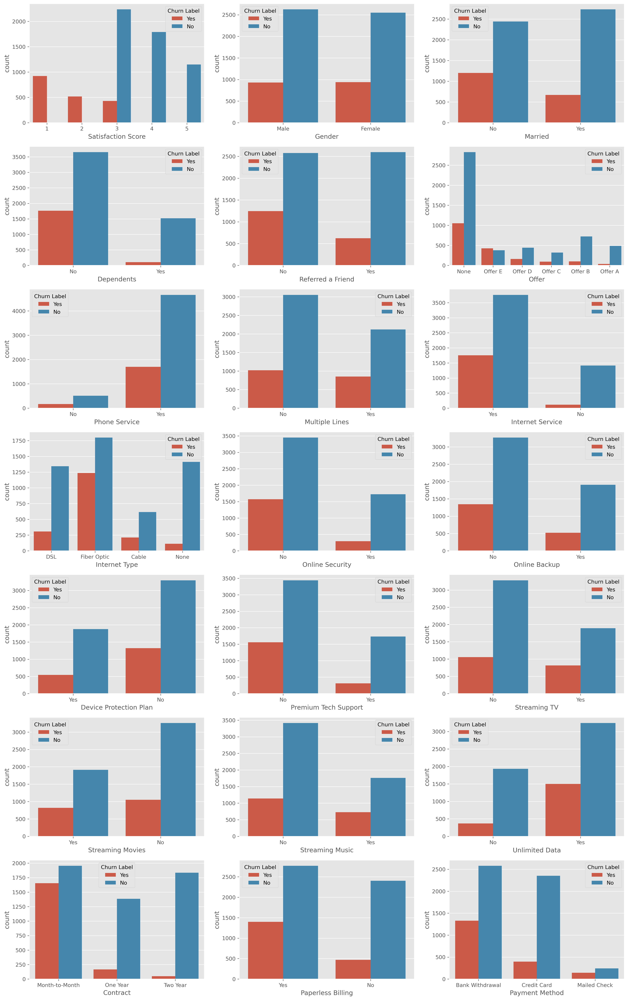

In [42]:
n_rows=7
n_cols=3

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 33), dpi=300)

for i, column in enumerate(['Satisfaction Score',
                            'Gender','Married','Dependents',
                            'Referred a Friend','Offer','Phone Service','Multiple Lines','Internet Service',
                            'Internet Type','Online Security','Online Backup','Device Protection Plan','Premium Tech Support',
                            'Streaming TV','Streaming Movies','Streaming Music','Unlimited Data','Contract','Paperless Billing','Payment Method'
                            
                            ]):
    sns.countplot(data=df_final,ax=axes[i//n_cols,i%n_cols],x=column, hue='Churn Label')

In [43]:
df_final.groupby(['Online Security'])['Churn Value'].value_counts(normalize=True).unstack(fill_value=0)

Churn Value,0,1
Online Security,,
No,0.687,0.313
Yes,0.854,0.146


In [44]:
df_final.groupby(['Device Protection Plan'])['Churn Value'].value_counts(normalize=True).unstack(fill_value=0)

Churn Value,0,1
Device Protection Plan,,
No,0.713,0.287
Yes,0.775,0.225


In [45]:
df_final.groupby(['Premium Tech Support'])['Churn Value'].value_counts(normalize=True).unstack(fill_value=0)

Churn Value,0,1
Premium Tech Support,,
No,0.688,0.312
Yes,0.848,0.152


In [46]:
df_final.groupby(['Unlimited Data'])['Churn Value'].value_counts(normalize=True).unstack(fill_value=0)

Churn Value,0,1
Unlimited Data,,
No,0.840,0.160
Yes,0.683,0.317


In [47]:
df_final.groupby(['Paperless Billing'])['Churn Value'].value_counts(normalize=True).unstack(fill_value=0)

Churn Value,0,1
Paperless Billing,,
No,0.837,0.163
Yes,0.664,0.336


In [48]:
df_final.groupby(['Payment Method'])['Churn Value'].value_counts(normalize=True).unstack(fill_value=0)

Churn Value,0,1
Payment Method,,
Bank Withdrawal,0.660,0.340
Credit Card,0.855,0.145
Mailed Check,0.631,0.369


- Sólo fugan los clientes que tienen un puntaje de satisfacción de 1 o 2. Para el puntaje de satisfacción 3 hay clientes fugados, pero se concentran, también, la mayor cantidad de clientes no fugados.
- La mayor proporción de clientes fugados se da en clientes con el tipo de oferta E y luego con los de ningún tipo de oferta.
- Existe una gran proporción de clientes fugados que usaron fibra óptica como tipo de internet.
- Existe una gran proporción de clientes fugados que tuvieron un tipo de contrato mensual.
- Hay una mayor proporción de clientes fugados que no tenían servicios de: seguridad online, respaldo online, servicio de protección de dispositivos, servicio premium de tecnología y datos ilimitados
- La mayoría de clientes fugados tenían un contrato de mes a mes
- La mayor cantidad de clientes fugados pagan con retiro bancario

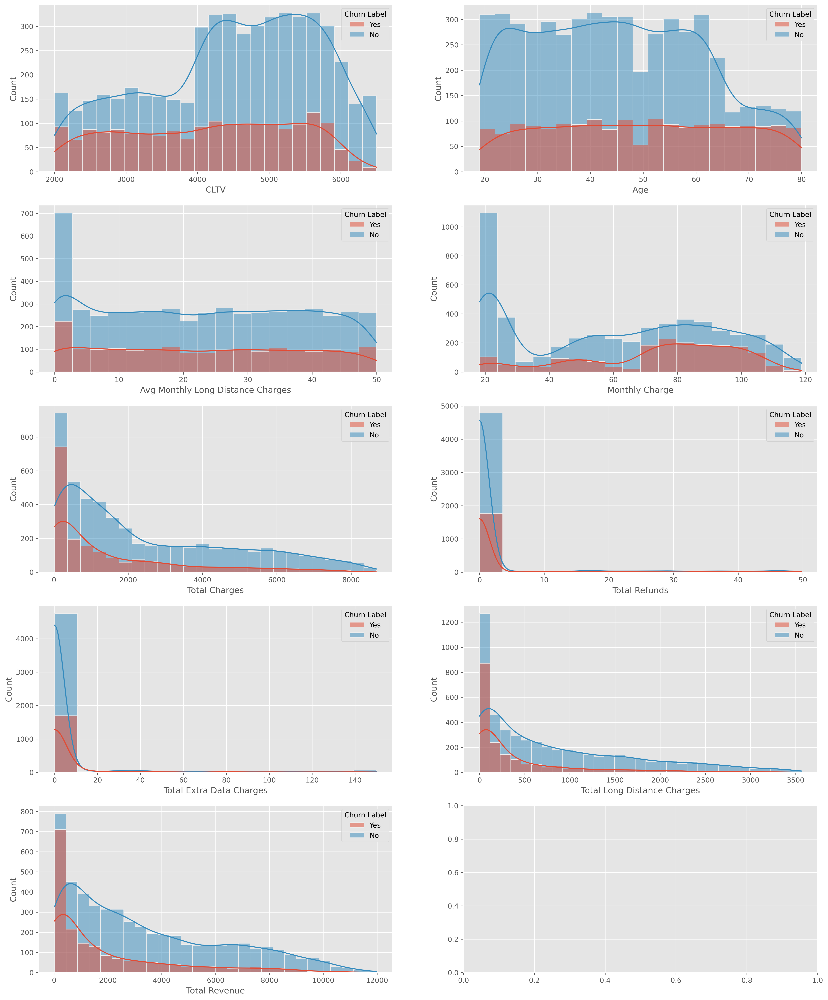

In [49]:
n_rows=5
n_cols=2

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 25), dpi=300)

for i, column in enumerate(['CLTV','Age','Avg Monthly Long Distance Charges','Monthly Charge','Total Charges','Total Refunds',
                       'Total Extra Data Charges','Total Long Distance Charges','Total Revenue'
                            ]):
    sns.histplot(df_final, x=column,ax=axes[i//n_cols,i%n_cols],kde='True', hue='Churn Label')

- Se puede ver que el existieron clientes con un CLTV alto que fugaron: es decir, que eran importantes e igual dejaron los servicios que se ofrecían
- El rango de edad de los clientes fugados parece no concentrarse en uno específico
- Tanto para los cargos y los ingresos se ve que hay una gran concentración al inicio de la distribución para los clientes fugados
- En los cargos mensuales, se puede ver una concentración de clientes fugados que fueron cobrados entre 70 a 110

To output multiple subplots, the figure containing the passed axes is being cleared.


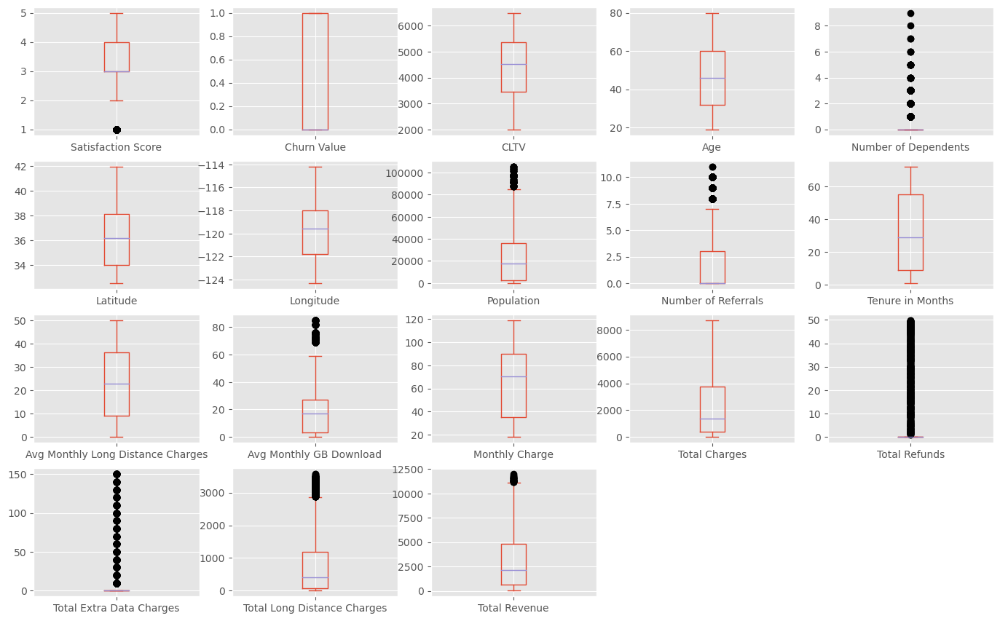

In [50]:
fig = plt.figure(figsize = (17,16))
ax = fig.gca()
df_final.rename(columns=lambda x: str(x)).plot(ax=ax, kind= 'box', subplots=True, layout=(6,5), sym='black')
plt.show()

- Outliers notables para variables como número de dependientes, reembolsos totales, población y cargos totales de datos extras.

Análisis por ciudades

In [51]:
pop_city = df_final.groupby('City').sum()[['Population']].reset_index()

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.


In [52]:
city_churn = df_final.groupby(['City']).sum()[['Churn Value']].sort_values(by='Churn Value', ascending=False).reset_index()

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.


In [53]:
city_churn2 = df_final.groupby(['City']).mean()[['Satisfaction Score']].sort_values(by='Satisfaction Score', ascending=False).reset_index().rename(columns = {'Satisfaction Score':'Satisfacción Promedio'})

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.


In [54]:
city_churn = city_churn.merge(pop_city[['Population','City']], how='left').drop_duplicates()

In [55]:
churn_proportion = df_final.groupby(['City'])['Churn Value'].value_counts(normalize=True).unstack(fill_value=0).reset_index()
churn_proportion.columns = ['City', 'Not Churn %', 'Churn %']

In [56]:
city_churn = city_churn.merge(city_churn2)

In [57]:
city_churn = city_churn.merge(churn_proportion, how='left').drop_duplicates()

Text(0.5, 1.0, 'Top 20 Ciudades con más fuga de clientes')

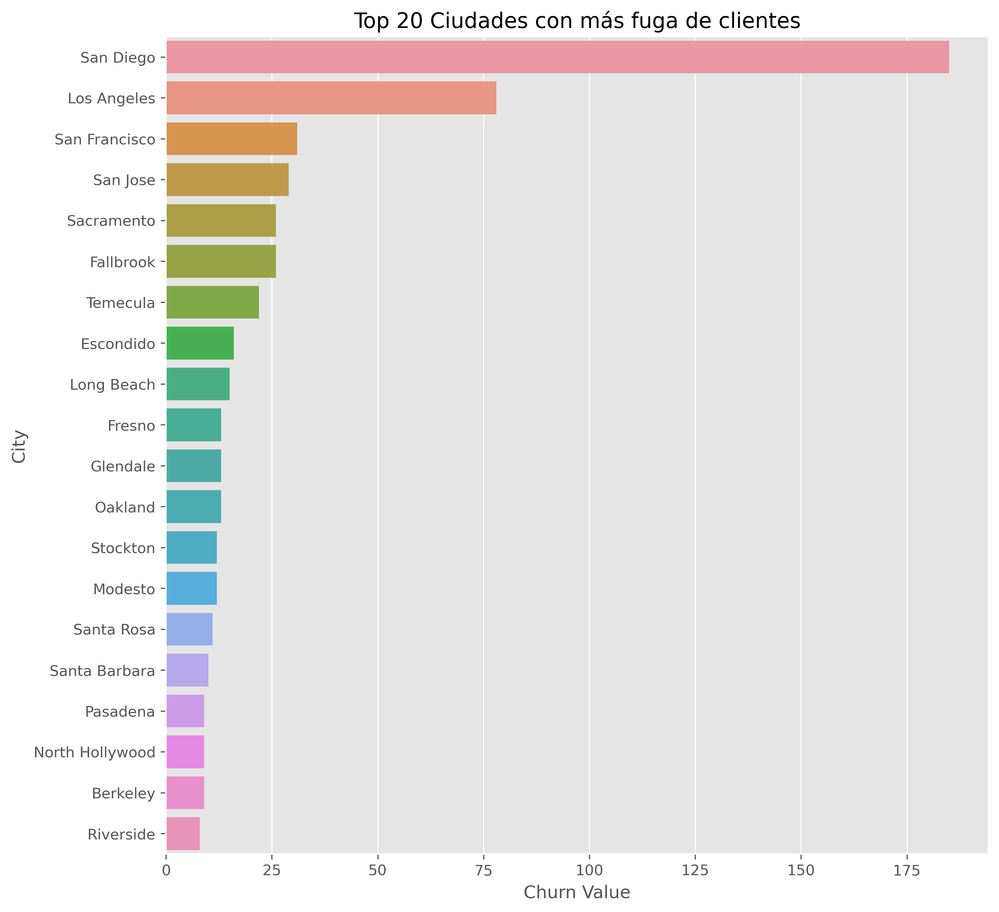

In [58]:
plt.figure(figsize=(10, 10), dpi=300)

sns.barplot(city_churn.sort_values(by='Churn Value', ascending=False).head(20), y='City', x='Churn Value')

plt.title('Top 20 Ciudades con más fuga de clientes')

In [ ]:
plt.figure(figsize=(10, 10), dpi=300)

sns.barplot(city_churn.sort_values(by='Churn Value', ascending=False).head(20), y='City', x='Churn Value')

plt.title('Top 20 Ciudades con más fuga de clientes')

Text(0.5, 1.0, 'Satisfacción Promedio de las Top 20 Ciudades con más fuga de clientes')

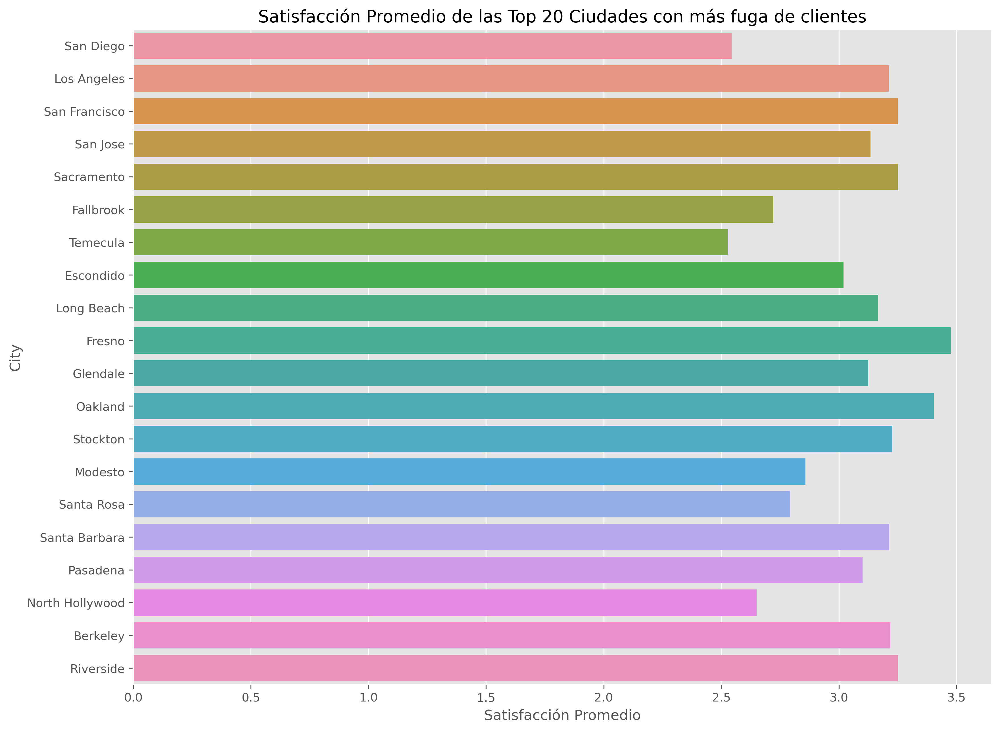

In [59]:
plt.figure(figsize=(13, 10), dpi=300)

sns.barplot(city_churn.sort_values(by='Churn Value', ascending=False).head(20), y='City', x='Satisfacción Promedio')

plt.title('Satisfacción Promedio de las Top 20 Ciudades con más fuga de clientes')

In [69]:
top5_ciudades = city_churn.sort_values(by='Churn Value', ascending=False)['City'].head(5).values.tolist()

### Solo clientes que Abandonaron

- La mayoría de clientes que fugaron y con más insatisfacción:
  - Tuvieron un contrato mensual
  - Tuvieron Facturación Electrónica
  - Pagaron mediante retiro bancario
  - Tenía internet de fibra óptica
  - No contaban con servicios adicionales como respaldo online, servicio de protección de dispositivos y soporte técnico premium

In [60]:
df_comentarios

,Satisfaction Score,Churn Label,Churn Value,CLTV,Churn Category,Churn Reason,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,City,Lat Long,Latitude,Longitude,Population,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
Customer ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8779-QRDMV,3,Yes,1,5433,Competitor,Competitor offered more data,Male,78,No,Yes,No,No,0,Los Angeles,"34.02381, -118.156582",34.024,-118.157,68701,No,0,1,None,No,0.000,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.650,39.650,0.000,20,0.000,59.650
7495-OOKFY,3,Yes,1,5302,Competitor,Competitor made better offer,Female,74,No,Yes,Yes,Yes,1,Los Angeles,"34.044271, -118.185237",34.044,-118.185,55668,Yes,1,8,Offer E,Yes,48.850,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.650,633.300,0.000,0,390.800,1024.100
1658-BYGOY,2,Yes,1,3179,Competitor,Competitor made better offer,Male,71,No,Yes,No,Yes,3,Los Angeles,"34.108833, -118.229715",34.109,-118.230,47534,No,0,18,Offer D,Yes,11.330,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.450,1752.550,45.610,0,203.940,1910.880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1699-HPSBG,3,Yes,1,4581,Competitor,Competitor offered higher download speeds,Male,44,No,No,No,No,0,Palm Springs,"33.745746, -116.514215",33.746,-116.514,18884,No,0,12,Offer D,Yes,9.600,No,Yes,Cable,23,No,No,No,Yes,Yes,No,No,Yes,One Year,Yes,Bank Withdrawal,59.800,727.800,0.000,0,115.200,843.000
8775-CEBBJ,2,Yes,1,2029,Competitor,Competitor offered higher download speeds,Female,40,No,No,No,No,0,Seeley,"32.790282, -115.689559",32.790,-115.690,1632,No,0,9,None,Yes,41.920,No,Yes,Cable,29,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,44.200,403.350,0.000,0,377.280,780.630
0639-TSIQW,1,Yes,1,5620,Competitor,Competitor offered more data,Female,28,Yes,No,No,No,0,White Water,"33.972293, -116.654195",33.972,-116.654,805,No,0,67,Offer A,Yes,37.500,Yes,Yes,Fiber Optic,30,Yes,Yes,Yes,No,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,102.950,6886.250,0.000,0,2512.500,9398.750


In [ ]:
n_rows=7
n_cols=3

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 33), dpi=300)

for i, column in enumerate([
                            'Gender','Married','Dependents',
                            'Referred a Friend','Offer','Phone Service','Multiple Lines','Internet Service',
                            'Internet Type','Online Security','Online Backup','Device Protection Plan','Premium Tech Support',
                            'Streaming TV','Streaming Movies','Streaming Music','Unlimited Data','Contract','Paperless Billing','Payment Method'
                            
                            ]):
    sns.countplot(data=df_comentarios,ax=axes[i//n_cols,i%n_cols],x=column, hue='Satisfaction Score')

In [133]:
churn_counts = df_comentarios.groupby(['Satisfaction Score', 'Churn Reason']).size().unstack(fill_value=0)
churn_counts.T

Satisfaction Score,1,2,3
Churn Reason,,,
Attitude of service provider,25,34,35
Attitude of support person,67,83,70
Competitor had better devices,302,11,0
...,...,...,...
Price too high,28,34,16
Product dissatisfaction,70,7,0
Service dissatisfaction,27,23,13


<AxesSubplot:ylabel='Churn Reason'>

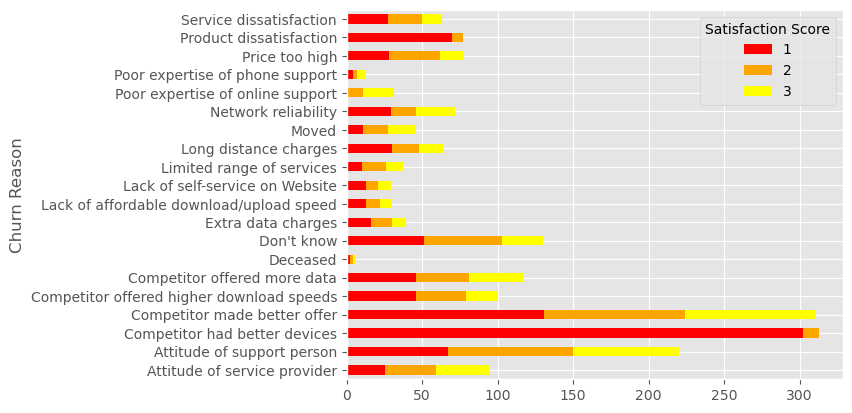

In [134]:
colors = ['red', 'orange', 'yellow']

churn_counts.T.plot(kind='barh', stacked=True, color=colors)

<AxesSubplot:xlabel='Satisfaction Score', ylabel='Churn Reason'>

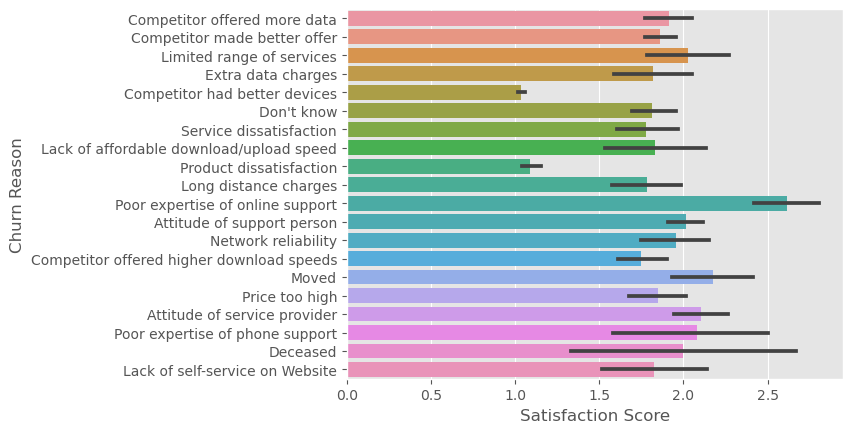

In [135]:
sns.barplot(df_comentarios, y='Churn Reason', x='Satisfaction Score')

- Razones de clientes que se fueron como: "el competidor tiene mejores equipos" y "disconformidad con los productos", tuvieron los menores puntajes de satisfacción promedio

<AxesSubplot:xlabel='Churn Category', ylabel='count'>

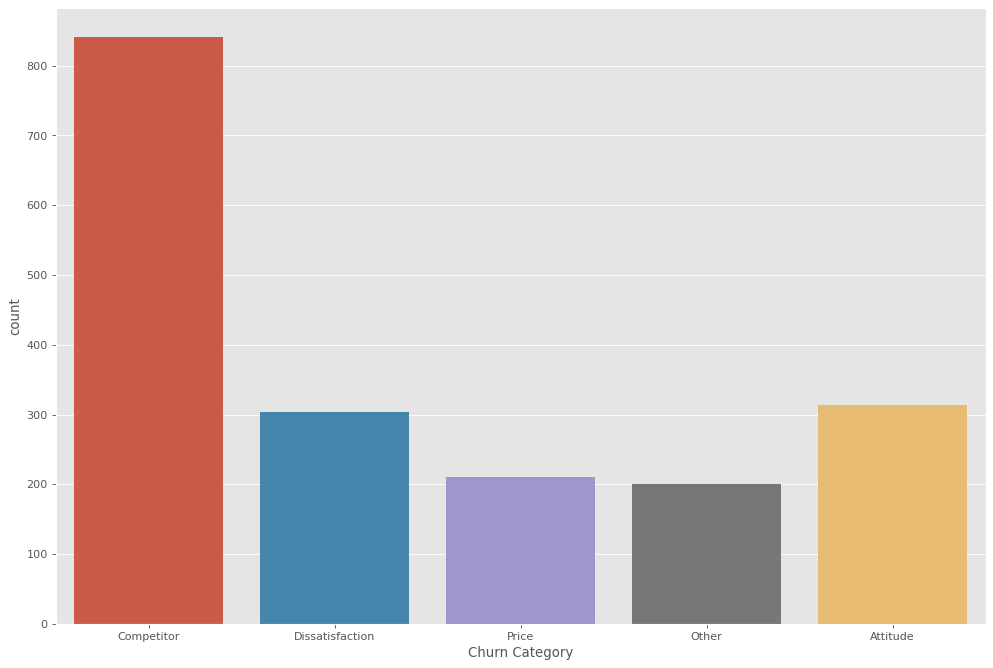

In [136]:
plt.figure(figsize=(15, 10), dpi=80)

sns.countplot(data=df_comentarios,x='Churn Category')

- La mayor categoría de fuga fueron los competidores

Text(0.5, 1.0, 'Puntaje promedio por Churn Category')

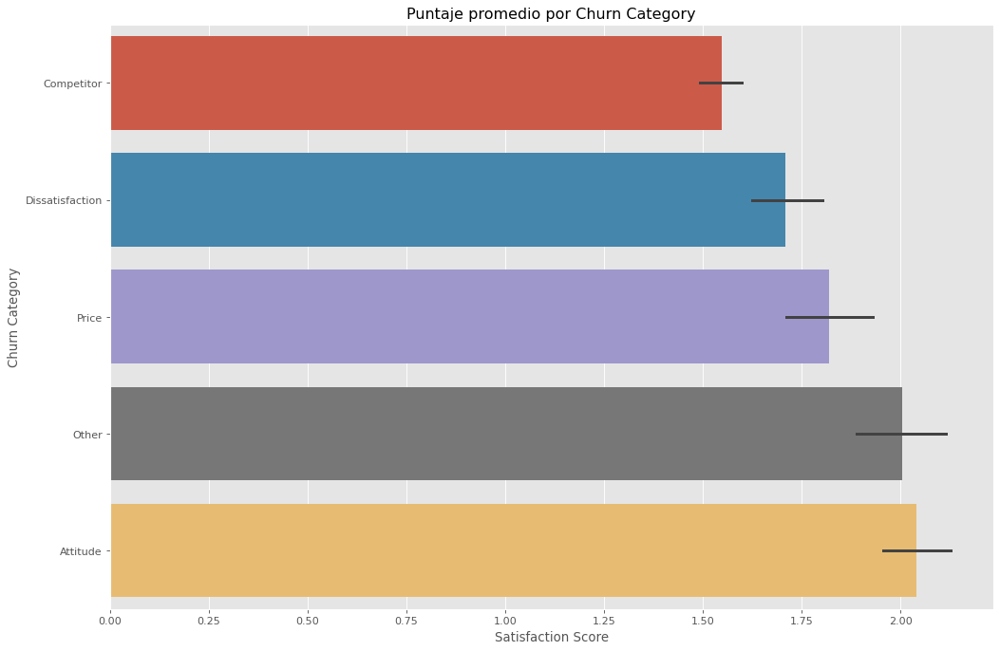

In [137]:
plt.figure(figsize=(15, 10), dpi=80)

sns.barplot(df_comentarios, y='Churn Category', x='Satisfaction Score')

plt.title('Puntaje promedio por Churn Category')

- Estos tenían un puntaje promedio de satisfacción menor a las demás razones

In [74]:
df_comentarios

,Satisfaction Score,Churn Label,Churn Value,CLTV,Churn Category,Churn Reason,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,City,Lat Long,Latitude,Longitude,Population,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
Customer ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8779-QRDMV,3,Yes,1,5433,Competitor,Competitor offered more data,Male,78,No,Yes,No,No,0,Los Angeles,"34.02381, -118.156582",34.024,-118.157,68701,No,0,1,None,No,0.000,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.650,39.650,0.000,20,0.000,59.650
7495-OOKFY,3,Yes,1,5302,Competitor,Competitor made better offer,Female,74,No,Yes,Yes,Yes,1,Los Angeles,"34.044271, -118.185237",34.044,-118.185,55668,Yes,1,8,Offer E,Yes,48.850,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.650,633.300,0.000,0,390.800,1024.100
1658-BYGOY,2,Yes,1,3179,Competitor,Competitor made better offer,Male,71,No,Yes,No,Yes,3,Los Angeles,"34.108833, -118.229715",34.109,-118.230,47534,No,0,18,Offer D,Yes,11.330,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.450,1752.550,45.610,0,203.940,1910.880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1699-HPSBG,3,Yes,1,4581,Competitor,Competitor offered higher download speeds,Male,44,No,No,No,No,0,Palm Springs,"33.745746, -116.514215",33.746,-116.514,18884,No,0,12,Offer D,Yes,9.600,No,Yes,Cable,23,No,No,No,Yes,Yes,No,No,Yes,One Year,Yes,Bank Withdrawal,59.800,727.800,0.000,0,115.200,843.000
8775-CEBBJ,2,Yes,1,2029,Competitor,Competitor offered higher download speeds,Female,40,No,No,No,No,0,Seeley,"32.790282, -115.689559",32.790,-115.690,1632,No,0,9,None,Yes,41.920,No,Yes,Cable,29,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,44.200,403.350,0.000,0,377.280,780.630
0639-TSIQW,1,Yes,1,5620,Competitor,Competitor offered more data,Female,28,Yes,No,No,No,0,White Water,"33.972293, -116.654195",33.972,-116.654,805,No,0,67,Offer A,Yes,37.500,Yes,Yes,Fiber Optic,30,Yes,Yes,Yes,No,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,102.950,6886.250,0.000,0,2512.500,9398.750


<AxesSubplot:ylabel='Churn Category'>

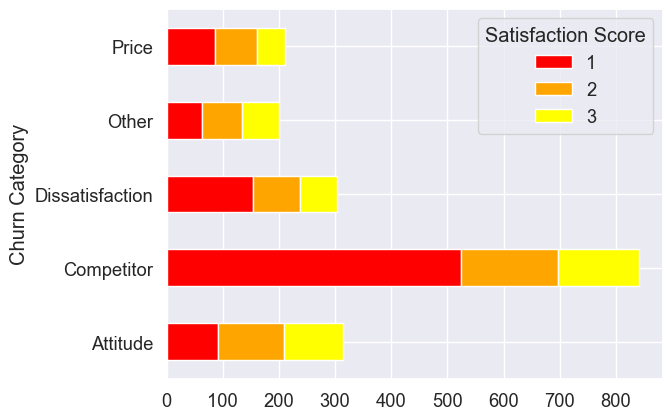

In [68]:
churn_counts_Category = df_comentarios.groupby(['Satisfaction Score', 'Churn Category']).size().unstack(fill_value=0)
colors = ['red', 'orange', 'yellow']

churn_counts_Category.T.plot(kind='barh', stacked=True, color=colors)

Text(0.5, 1.0, 'Top 10 razones de fuga')

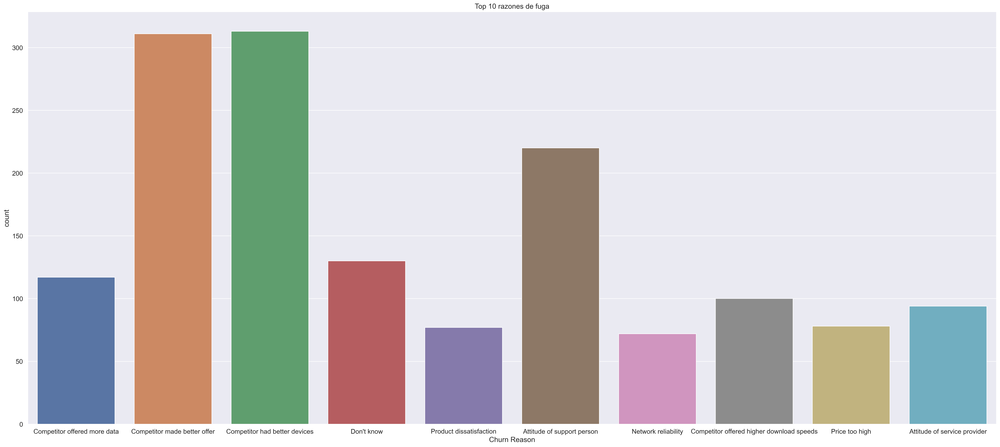

In [67]:
sns.set(font_scale=1.2)

plt.figure(figsize=(35, 15), dpi=300)

sns.countplot(data=df_comentarios[df_comentarios['Churn Reason'].isin(df_comentarios['Churn Reason'].value_counts().head(10).index)],x='Churn Reason')

plt.title('Top 10 razones de fuga')

Text(0.5, 1.0, 'Top 5 razones de fuga en top 5 ciudades')

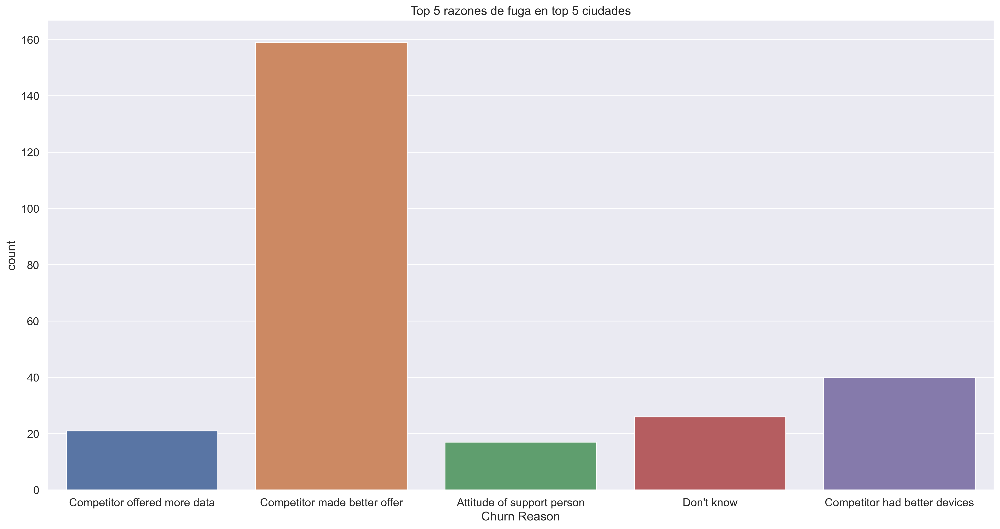

In [87]:
sns.set(font_scale=1.2)

plt.figure(figsize=(20, 10), dpi=300)

sns.countplot(data=df_comentarios[(df_comentarios['Churn Reason'].isin(df_comentarios['Churn Reason'].value_counts().head(5).index))
                                  &
                                  (df_comentarios['City'].isin(top5_ciudades))],x='Churn Reason')

plt.title('Top 5 razones de fuga en top 5 ciudades')

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


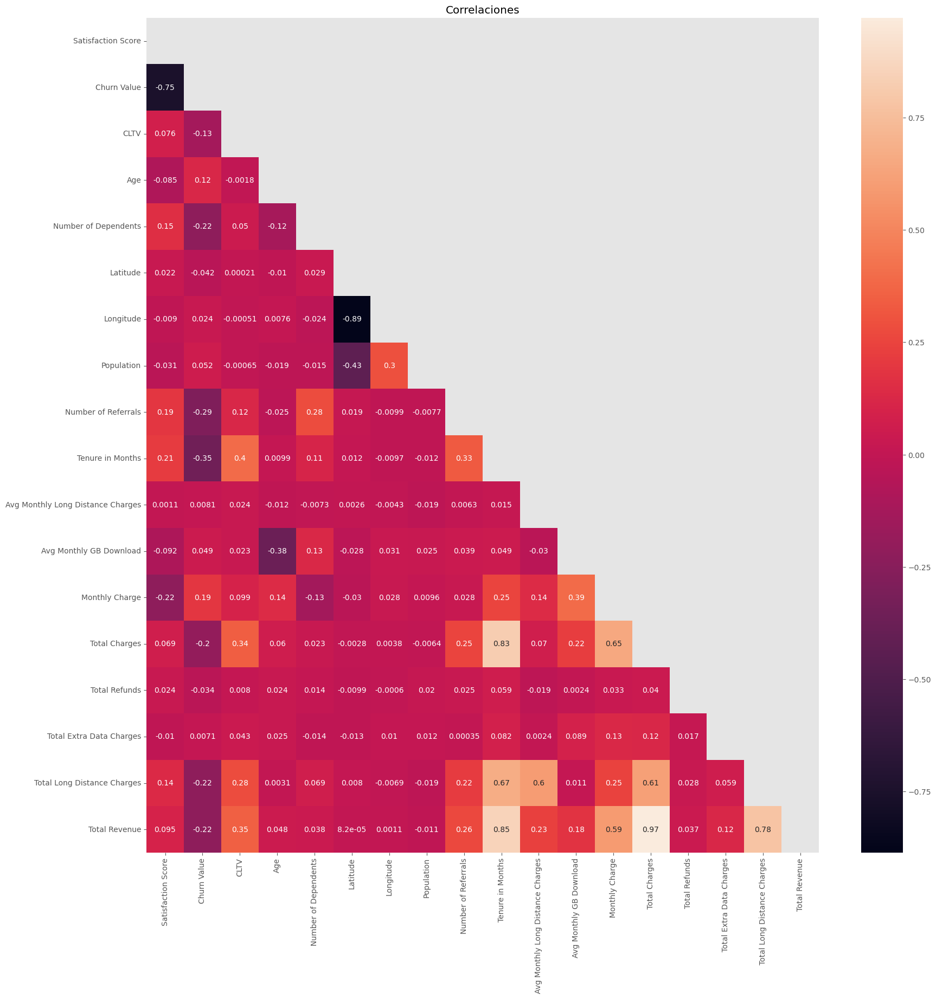

In [141]:
plt.rcParams['figure.figsize'] = (20, 20)

data_corr = df_final.corr()

mask = np.triu(np.ones_like(data_corr, dtype=bool))

sns.heatmap(data_corr, annot = True, mask=mask)
plt.title('Correlaciones')
plt.show()

In [142]:
corr = df_final.corr()
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(corr['Churn Value'].sort_values(ascending=False), '\n')

Churn Value                          1.000
Monthly Charge                       0.193
Age                                  0.116
Population                           0.052
Avg Monthly GB Download              0.049
Longitude                            0.024
Avg Monthly Long Distance Charges    0.008
Total Extra Data Charges             0.007
Total Refunds                       -0.034
Latitude                            -0.042
CLTV                                -0.127
Total Charges                       -0.199
Number of Dependents                -0.219
Total Revenue                       -0.223
Total Long Distance Charges         -0.224
Number of Referrals                 -0.287
Tenure in Months                    -0.353
Satisfaction Score                  -0.755
Name: Churn Value, dtype: float64 



The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


Gran correlación negativa de Satisfaction Score con el target

## Preprocesamiento

In [91]:
df_modelado = df_final.copy()

Dropeamos las columnas que no se utilizaran en el modelado

In [92]:
df_modelado = df_modelado.drop(columns=['Churn Label','Lat Long','Latitude','Longitude','Population'])

### Codeado de variables

Género

In [93]:
df_modelado['Gender'].unique()

array(['Male', 'Female'], dtype=object)

In [94]:
df_modelado['Gender'] = df_modelado['Gender'].map({'Male':1,'Female':0})

Menor de 30

In [95]:
df_modelado['Under 30'].unique()

array(['No', 'Yes'], dtype=object)

Variables que sean Sí o No

In [96]:
for i in ['Under 30', 'Senior Citizen', 'Married', 'Dependents', 'Referred a Friend','Phone Service', 'Multiple Lines','Internet Service',
          'Online Security','Online Backup','Device Protection Plan','Premium Tech Support','Streaming TV','Streaming Movies','Streaming Music',
          'Unlimited Data','Paperless Billing']:
    df_modelado[i] = df_modelado[i].map({'Yes':1,'No':0})

Ciudades

In [97]:
le = LabelEncoder()

In [98]:
df_modelado['City'].nunique()

1106

In [99]:
df_modelado['City'] = le.fit_transform(df_modelado['City'])

In [100]:
df_modelado['City'].nunique()

1106

Tipo de Oferta

In [101]:
df_modelado['Offer'].value_counts().sort_index()

None       3877
Offer A     520
Offer B     824
Offer C     415
Offer D     602
Offer E     805
Name: Offer, dtype: int64

In [102]:
df_modelado['Offer'] = le.fit_transform(df_modelado['Offer'])

In [103]:
df_modelado['Offer'].value_counts().sort_index()

0    3877
1     520
2     824
3     415
4     602
5     805
Name: Offer, dtype: int64

Tipo de internet

In [104]:
df_modelado['Internet Type'].value_counts()

Fiber Optic    3035
DSL            1652
None           1526
Cable           830
Name: Internet Type, dtype: int64

In [105]:
df_modelado['Internet Type'] = df_modelado['Internet Type'].map({'None':0,'DSL':1, 'Cable':2,'Fiber Optic':3 })

Tipo de Contrato

In [106]:
df_modelado['Contract'].value_counts()

Month-to-Month    3610
Two Year          1883
One Year          1550
Name: Contract, dtype: int64

In [107]:
df_modelado['Contract'] = df_modelado['Contract'].map({'Month-to-Month':0,'One Year':1, 'Two Year':2 })

Método de Pago

In [108]:
df_modelado['Payment Method'].value_counts()

Bank Withdrawal    3909
Credit Card        2749
Mailed Check        385
Name: Payment Method, dtype: int64

In [109]:
df_modelado['Payment Method'] = le.fit_transform(df_modelado['Payment Method'])

In [110]:
df_modelado['Payment Method'].value_counts()

0    3909
1    2749
2     385
Name: Payment Method, dtype: int64

### Balanceamiento de Target con SMOTETomek

<AxesSubplot:xlabel='Churn Value', ylabel='count'>

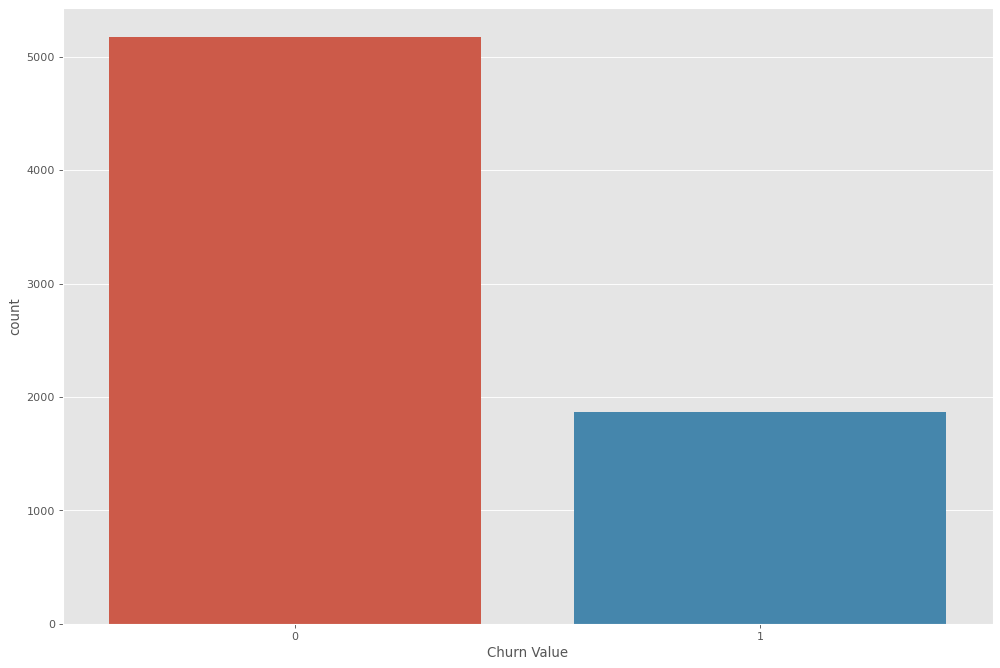

In [111]:
plt.figure(figsize=(15, 10), dpi=80)

sns.countplot(data=df_modelado,x='Churn Value')

In [112]:
df_modelado['Churn Value'].value_counts(normalize=True)*100

0   73.463
1   26.537
Name: Churn Value, dtype: float64

In [113]:
y = df_modelado['Churn Value']

X = df_modelado.drop(columns=['Churn Value'])

In [114]:
X_train, X_test, y_train, y_test =train_test_split(X,
                                                   y,
                                                   test_size=0.3, 
                                                   random_state=42, 
                                                   stratify=y)

Escalamiento de variables

In [115]:
scaler = StandardScaler()

scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

SMOTETomek

In [116]:
os_us = SMOTETomek(random_state=42)

In [117]:
X_t_st, y_t_st = os_us.fit_resample(X_train, y_train)

In [118]:
X_t_st_df= pd.DataFrame(X_t_st, columns=X.columns)
y_t_st_df= pd.DataFrame(y_t_st, columns=["Churn Value"])

Train Balanceado

In [119]:
train_balanceado = pd.concat([X_t_st_df, y_t_st_df], axis=1)
train_balanceado.head()

,Satisfaction Score,CLTV,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,City,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Value
0,-0.207,0.816,-1.018,-0.923,-0.500,-0.446,1.028,-0.548,-0.487,0.863,1.078,2.710,1.282,-0.768,0.330,-0.236,-0.860,0.526,1.023,0.026,1.597,-0.722,-0.728,1.564,1.251,1.249,1.337,0.692,0.288,0.819,0.840,1.066,1.779,1.464,-0.269,0.572,1.569,0
1,-0.207,-1.766,0.982,0.623,-0.500,-0.446,-0.973,-0.548,-0.487,-1.253,-0.928,-0.651,-1.278,1.969,0.330,-1.124,-0.860,0.526,-0.622,-0.367,-0.626,-0.722,-0.728,-0.640,-0.799,-0.800,-0.748,0.692,-0.891,0.819,2.506,-0.632,-0.985,-0.248,-0.269,-0.879,-1.039,1
2,-1.036,0.187,-1.018,1.040,-0.500,-0.446,-0.973,-0.548,-0.487,0.125,-0.928,-0.651,-1.278,-0.768,0.330,-0.086,-0.860,0.526,1.023,0.222,-0.626,-0.722,-0.728,-0.640,-0.799,-0.800,-0.748,0.692,-0.891,-1.221,-0.827,0.164,-0.974,-0.248,-0.269,-0.860,-1.025,1
3,-0.207,-0.332,0.982,-0.388,-0.500,-0.446,-0.973,-0.548,-0.487,-0.908,-0.928,-0.651,0.266,0.874,-3.027,-1.484,-0.860,0.526,-0.622,-0.367,1.597,-0.722,-0.728,1.564,1.251,-0.800,-0.748,0.692,0.288,-1.221,-0.827,-0.654,-0.215,-0.248,-0.269,-0.885,-0.433,0
4,-1.865,0.185,0.982,1.575,-0.500,2.244,-0.973,-0.548,-0.487,1.448,-0.928,-0.651,-1.116,-0.768,0.330,-0.270,-0.860,0.526,-0.622,0.369,-0.626,-0.722,1.374,-0.640,-0.799,-0.800,-0.748,0.692,-0.891,-1.221,-0.827,-0.478,-0.900,-0.248,-0.269,-0.775,-0.942,1


In [120]:
train_balanceado['Churn Value'].value_counts(normalize='True')

0   0.500
1   0.500
Name: Churn Value, dtype: float64

<AxesSubplot:xlabel='Churn Value', ylabel='count'>

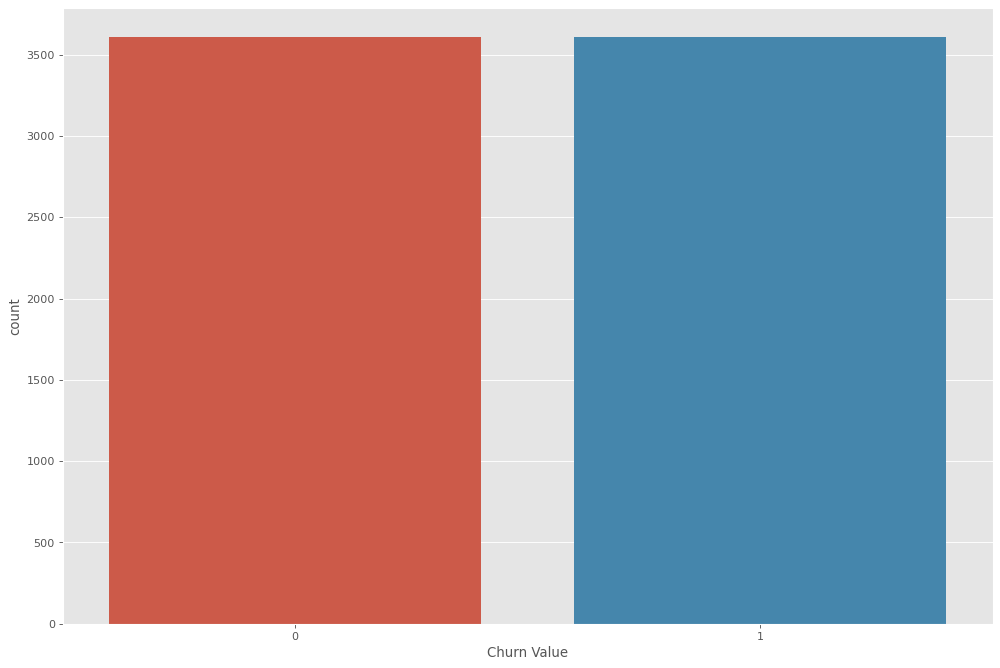

In [172]:
plt.figure(figsize=(15, 10), dpi=80)

sns.countplot(data=train_balanceado,x='Churn Value')

## Modelado para seleccion de variables

In [173]:
num_folds = 10


models = []
models.append(("KNN", KNeighborsClassifier()))
models.append(("Decision Tree", DecisionTreeClassifier(max_depth=5)))
models.append(("Bagging Trees", BaggingClassifier()))
models.append(("Logistic Regression (L1)", LogisticRegression(penalty='l1', solver='liblinear')))
models.append(("Logistic Regression (L2)", LogisticRegression(penalty='l2')))
models.append(("Random Forest", RandomForestClassifier(n_estimators=200, criterion= 'entropy')))
models.append(("AdaBoost Classifier", AdaBoostClassifier(n_estimators=200)))
models.append(("XGBoost Classifier", xgb.XGBClassifier(n_estimators=200, objective = 'binary:logistic')))
models.append(("Multi-layer Perceptron", MLPClassifier(solver='lbfgs')))

In [76]:
results = []
names = []
scoring = 'f1'
for name, model in models:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, X_t_st, y_t_st, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print(f"{name}: {cv_results.mean():,.3f} ({cv_results.std():,.3f})")

KNN: 0.838 (0.108)
Decision Tree: 0.922 (0.050)
Bagging Trees: 0.948 (0.032)
Logistic Regression (L1): 0.939 (0.031)
Logistic Regression (L2): 0.937 (0.031)
Random Forest: 0.958 (0.026)
AdaBoost Classifier: 0.948 (0.032)
XGBoost Classifier: 0.960 (0.027)
Multi-layer Perceptron: 0.951 (0.036)


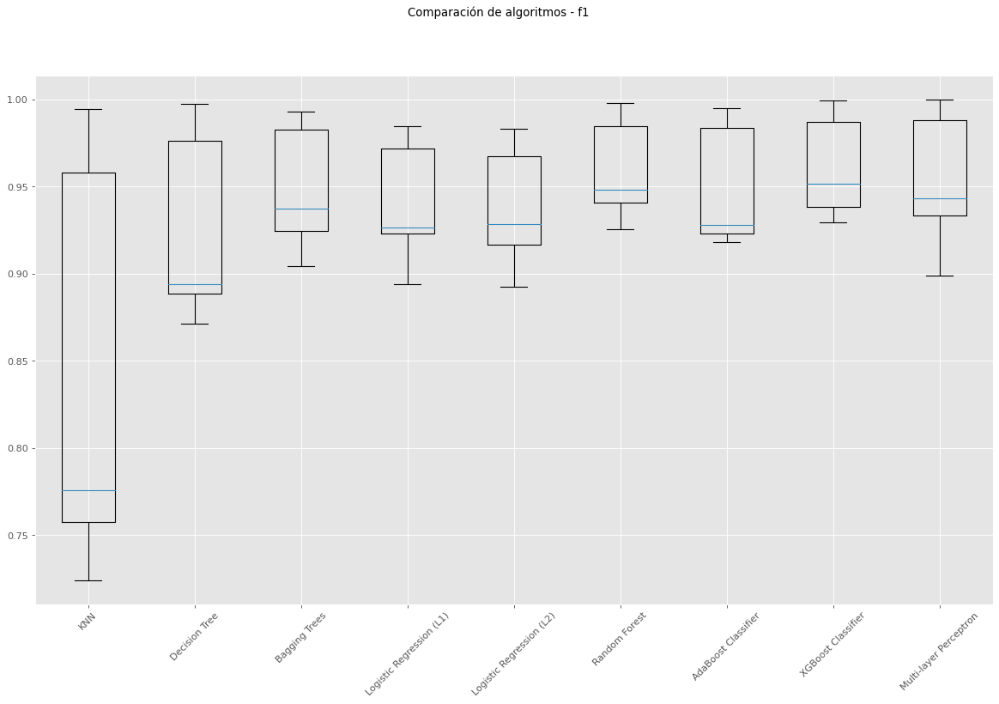

In [77]:
fig = plt.figure(figsize=(18, 10), dpi=80)

fig.suptitle('Comparación de algoritmos - f1')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation = 45)
plt.show()

El modelo con mejor performance es el XGBClassifier

In [81]:
model = xgb.XGBClassifier(n_estimators=200, objective = 'binary:logistic')

In [82]:
model.fit(X_t_st, y_t_st)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

Variables más importantes a seleccionar

<AxesSubplot:>

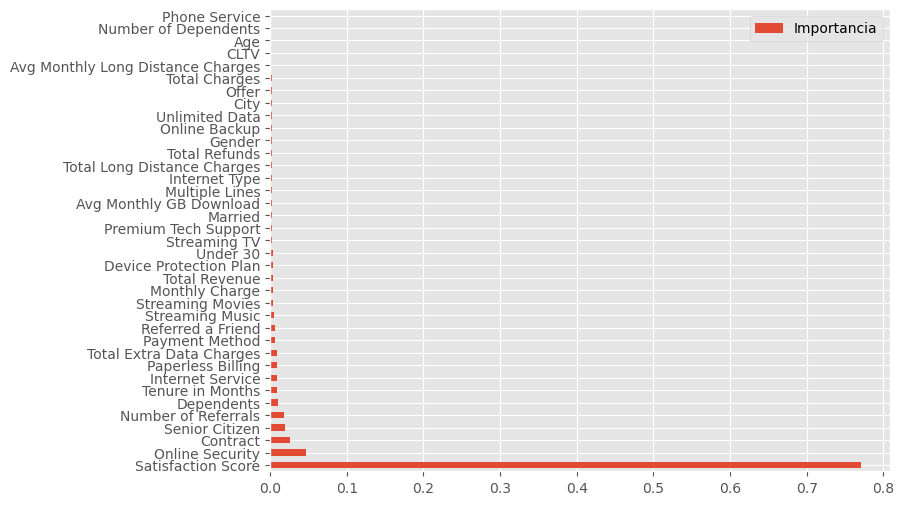

In [83]:
feat_importancesRF = pd.DataFrame(model.feature_importances_, index=X.columns, columns=["Importancia"])
feat_importancesRF.sort_values(by='Importancia', ascending=False, inplace=True)
feat_importancesRF.plot(kind='barh', figsize=(8,6))

Filtramos las 17 variables más importantes 

In [84]:
Variables_Importantes = feat_importancesRF.head(17).index.tolist()

In [121]:
Variables_Importantes = ['Satisfaction Score', 'Online Security', 'Contract', 'Senior Citizen', 'Number of Referrals', 'Dependents', 'Tenure in Months', 'Internet Service', 'Paperless Billing', 'Total Extra Data Charges', 'Payment Method', 'Referred a Friend', 'Streaming Music', 'Streaming Movies', 'Monthly Charge', 'Total Revenue', 'Device Protection Plan']

['Satisfaction Score', 'Online Security', 'Contract', 'Senior Citizen', 'Number of Referrals', 'Dependents', 'Tenure in Months', 'Internet Service', 'Paperless Billing', 'Total Extra Data Charges', 'Payment Method', 'Referred a Friend', 'Streaming Music', 'Streaming Movies', 'Monthly Charge', 'Total Revenue', 'Device Protection Plan']

## Modelado Final

In [122]:
y = df_modelado['Churn Value']

X = df_modelado.drop(columns=['Churn Value'])[Variables_Importantes]

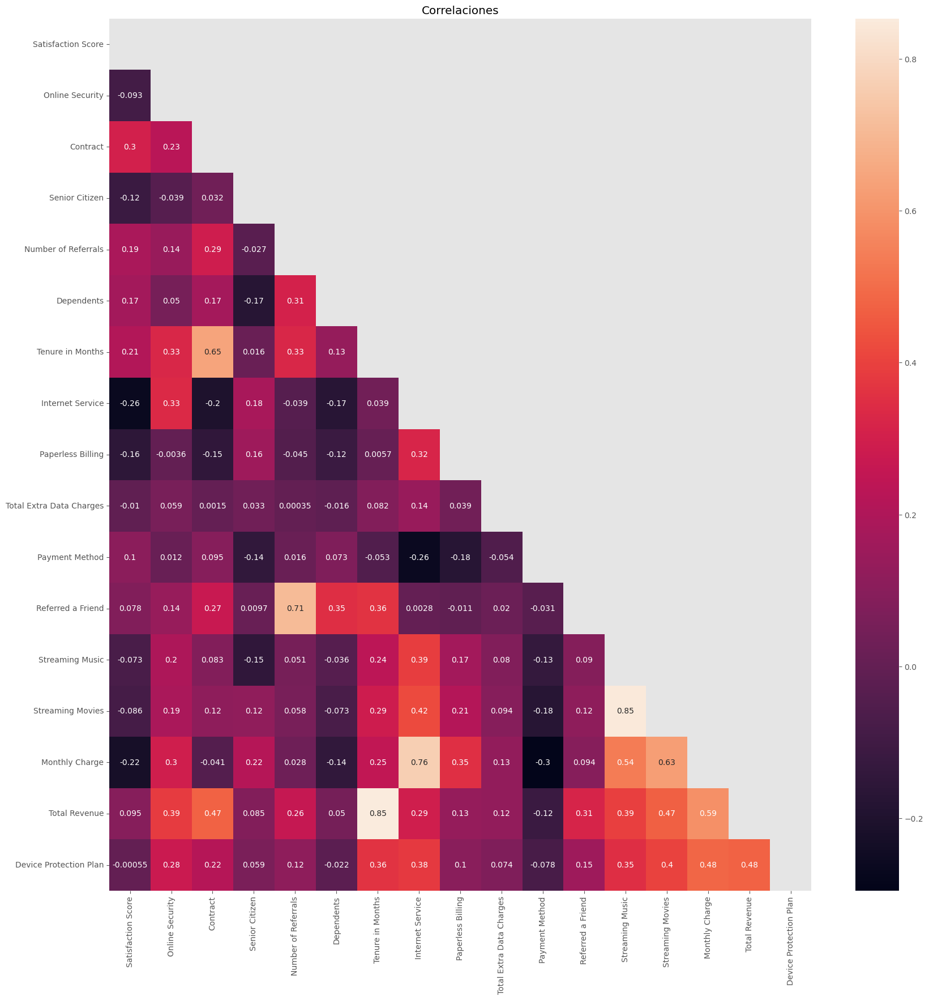

In [138]:
plt.rcParams['figure.figsize'] = (20, 20)

data_corr = X.corr()

mask = np.triu(np.ones_like(data_corr, dtype=bool))

sns.heatmap(data_corr, annot = True, mask=mask)
plt.title('Correlaciones')
plt.show()

In [174]:
X_train, X_test, y_train, y_test =train_test_split(X,
                                                   y,
                                                   test_size=0.3, 
                                                   random_state=42, 
                                                   stratify=y)

Escalamiento

In [175]:
scaler = StandardScaler()

scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

SMOTETomek

In [178]:
os_us = SMOTETomek(random_state=42)

In [179]:
X_t_st, y_t_st = os_us.fit_resample(X_train, y_train)

In [180]:
X_t_st_df= pd.DataFrame(X_t_st, columns=X.columns)
y_t_st_df= pd.DataFrame(y_t_st, columns=["Churn Value"])

In [181]:
X_test = pd.DataFrame(X_test, columns=X.columns)
y_test = pd.DataFrame(y_test, columns=["Churn Value"])

In [182]:
X_test['Satisfaction Score'].value_counts()

-0.207    817
0.622     531
1.452     334
-1.865    272
-1.036    159
Name: Satisfaction Score, dtype: int64

df train balanceado

In [183]:
train_balanceado = pd.concat([X_t_st_df, y_t_st_df], axis=1)
train_balanceado.head()

,Satisfaction Score,Online Security,Contract,Senior Citizen,Number of Referrals,Dependents,Tenure in Months,Internet Service,Paperless Billing,Total Extra Data Charges,Payment Method,Referred a Friend,Streaming Music,Streaming Movies,Monthly Charge,Total Revenue,Device Protection Plan,Churn Value
0,-0.207,1.597,0.288,-0.446,2.710,-0.548,1.282,0.526,0.819,-0.269,0.840,1.078,1.337,1.249,1.066,1.569,-0.728,0
1,-0.207,-0.626,-0.891,-0.446,-0.651,-0.548,-1.278,0.526,0.819,-0.269,2.506,-0.928,-0.748,-0.800,-0.632,-1.039,-0.728,1
2,-1.036,-0.626,-0.891,-0.446,-0.651,-0.548,-1.278,0.526,-1.221,-0.269,-0.827,-0.928,-0.748,-0.800,0.164,-1.025,-0.728,1
3,-0.207,1.597,0.288,-0.446,-0.651,-0.548,0.266,0.526,-1.221,-0.269,-0.827,-0.928,-0.748,-0.800,-0.654,-0.433,-0.728,0
4,-1.865,-0.626,-0.891,2.244,-0.651,-0.548,-1.116,0.526,-1.221,-0.269,-0.827,-0.928,-0.748,-0.800,-0.478,-0.942,1.374,1


In [184]:
train_balanceado['Churn Value'].value_counts(normalize='True')

0   0.500
1   0.500
Name: Churn Value, dtype: float64

### Tuneado XGboost con HYPEROPT 

In [94]:
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0,
        'random_state':42
    }

Se establece métrica de evaluación AUC

In [95]:
def objective(space):
    clf=xgb.XGBClassifier(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),
                    eval_metric="auc",
                    early_stopping_rounds=10,random_state=42,seed=27)
    
    evaluation = [(X_t_st_df, y_t_st_df), ( X_test, y_test)]
    
    clf.fit(X_t_st_df, y_t_st_df,
            eval_set=evaluation,
            verbose=False)
    

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

In [96]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

SCORE:                                                 
0.9522006625650734                                     
SCORE:                                                                            
0.9493610979649787                                                                
SCORE:                                                                            
0.9517274017983909                                                                
SCORE:                                                                            
0.9517274017983909                                                                
SCORE:                                                                            
0.950780880265026                                                                 
SCORE:                                                                            
0.9531471840984382                                                                
SCORE:                                                    

Se imprimen los mejores hiperparametros 

In [97]:
print("Mejores hyperparametros : ","\n")
print(best_hyperparams)

Mejores hyperparametros :  

{'colsample_bytree': 0.8224506395273834, 'gamma': 7.523889936788071, 'max_depth': 4.0, 'min_child_weight': 10.0, 'reg_alpha': 41.0, 'reg_lambda': 0.6396149280329773}


Se establece el modelo tuneado

In [98]:
model_best = xgb.XGBClassifier(colsample_bytree=best_hyperparams['colsample_bytree'],
                      n_estimators=1000, 
                      min_child_weight=int(best_hyperparams['min_child_weight']),
                      reg_alpha = best_hyperparams['reg_alpha'],
                      reg_lambda=best_hyperparams['reg_lambda'],
                      max_depth=int(best_hyperparams['max_depth']), 
                      gamma=best_hyperparams['gamma'])

Fit del modelo

In [99]:
model_best_fit = model_best.fit(X_t_st_df, y_t_st_df,
            verbose=False)

### Métricas del Modelo

In [100]:
print('Training accuracy:', model_best_fit.score(X_t_st_df, y_t_st_df))
print('Testing accuracy:', model_best_fit.score(X_test, y_test))

Training accuracy: 0.9663689645548423
Testing accuracy: 0.955040227165168


Se guarda el modelo

In [101]:
# filename = 'mejor_modelo.pkl'
# pickle.dump(model_best, open(filename, 'wb'))

In [132]:
filename = 'mejor_modelo.pkl'
model_best = pickle.load(open(filename, 'rb'))

In [184]:
clf = model_best.get_booster()
print(clf.feature_names)   

['Satisfaction Score', 'Online Security', 'Contract', 'Senior Citizen', 'Number of Referrals', 'Dependents', 'Tenure in Months', 'Internet Service', 'Paperless Billing', 'Total Extra Data Charges', 'Payment Method', 'Referred a Friend', 'Streaming Music', 'Streaming Movies', 'Monthly Charge', 'Total Revenue', 'Device Protection Plan']


              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1552
           1       0.91      0.92      0.92       561

    accuracy                           0.96      2113
   macro avg       0.94      0.94      0.94      2113
weighted avg       0.96      0.96      0.96      2113

AUC ROC :  0.9432157000569675


Text(0.5, 1.0, 'ROC')

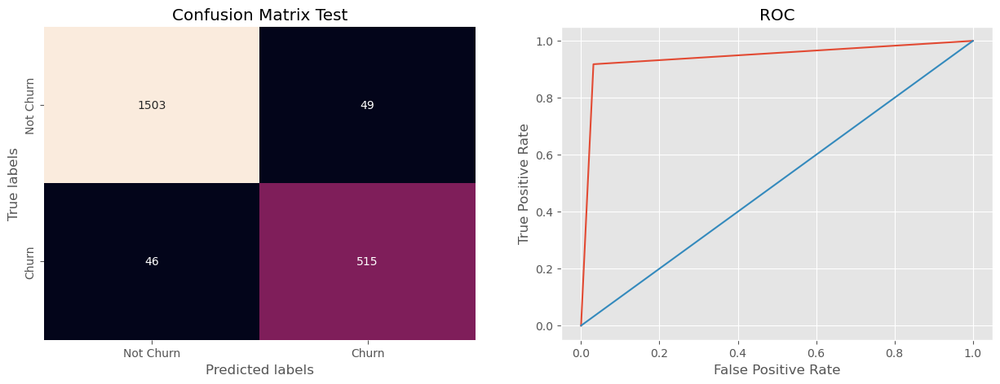

In [96]:
predictions = model_best.predict(X_test) #Validación sobre la data de testing
conf_mtx = confusion_matrix(y_test,predictions) #Matriz de confusión de la data de testing real con la predicha

f, axes = plt.subplots(ncols=2, figsize=(15, 5)) #Definición del área de visualización (2 gráficas)

sns.heatmap(conf_mtx,annot=True,cbar = False,fmt = "g",ax = axes[0])#definición del formato de la matriz de confusión
axes[0].set_xlabel('Predicted labels') #Titulo del eje x de la matriz de confusión
axes[0].set_ylabel('True labels') #Titulo del eje y de la matriz de confusión
axes[0].set_title('Confusion Matrix Test'); #Titulo de la matriz de confusión
axes[0].xaxis.set_ticklabels(['Not Churn', 'Churn']); #distribución de los resultados en la matriz de confusión del eje x
axes[0].yaxis.set_ticklabels(['Not Churn', 'Churn']); #distribución de los resultados en la matriz de confusión del eje y

print(classification_report(y_test,predictions)) #mostrar resultados

roc_auc = roc_auc_score(y_test,predictions) #definición del cálculo del auc
print ("AUC ROC : ",roc_auc) #mostrar el resultado

fpr, tpr,_ = roc_curve(y_test, predictions) #Función para armar la curva ROC
#fpr : false positive rate
#tpr : true positive rate
axes[1].plot(fpr,tpr,label= "auc="+str(roc_auc)); #código para mostrar el resultado del auc en la gráfica
axes[1].plot([0, 1], [0, 1]) #código del formato de la gráfica
plt.xlabel('False Positive Rate') #título del eje x
plt.ylabel('True Positive Rate') #título del eje y
plt.title('ROC') #título del gráfico

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

<Figure size 6000x4500 with 0 Axes>

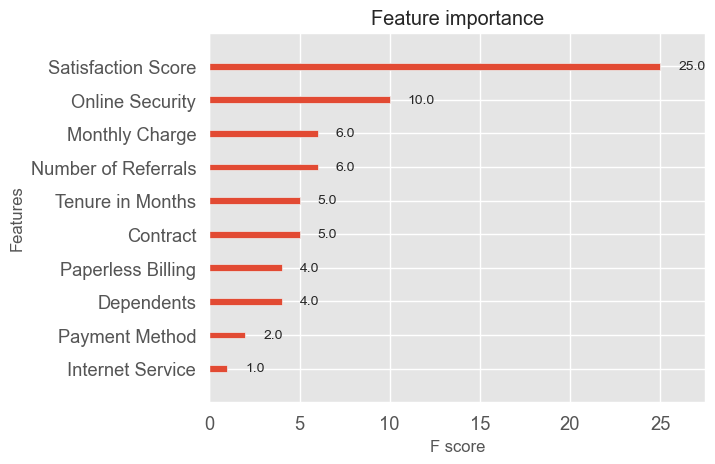

In [103]:
plt.figure(figsize=(20, 15), dpi=300)

xgb.plot_importance(model_best)

In [191]:
explainer = shap.TreeExplainer(model_best)
shap_values = explainer.shap_values(X_test)

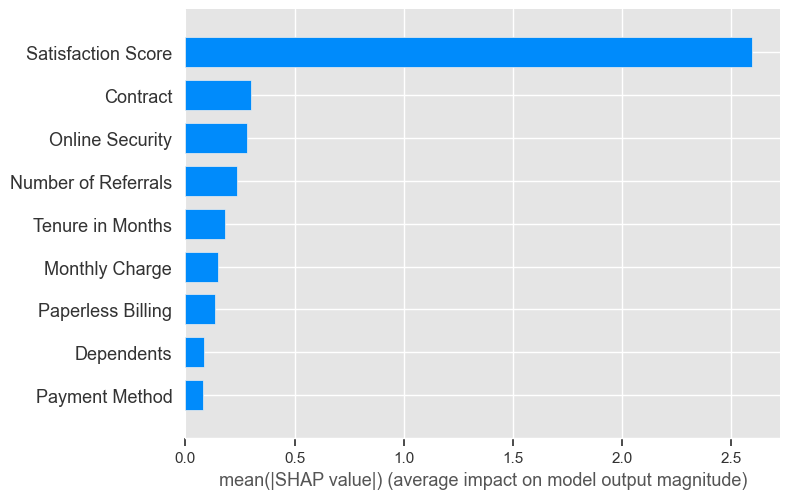

In [107]:
shap.summary_plot(shap_values, X_test, plot_type="bar", max_display=9)

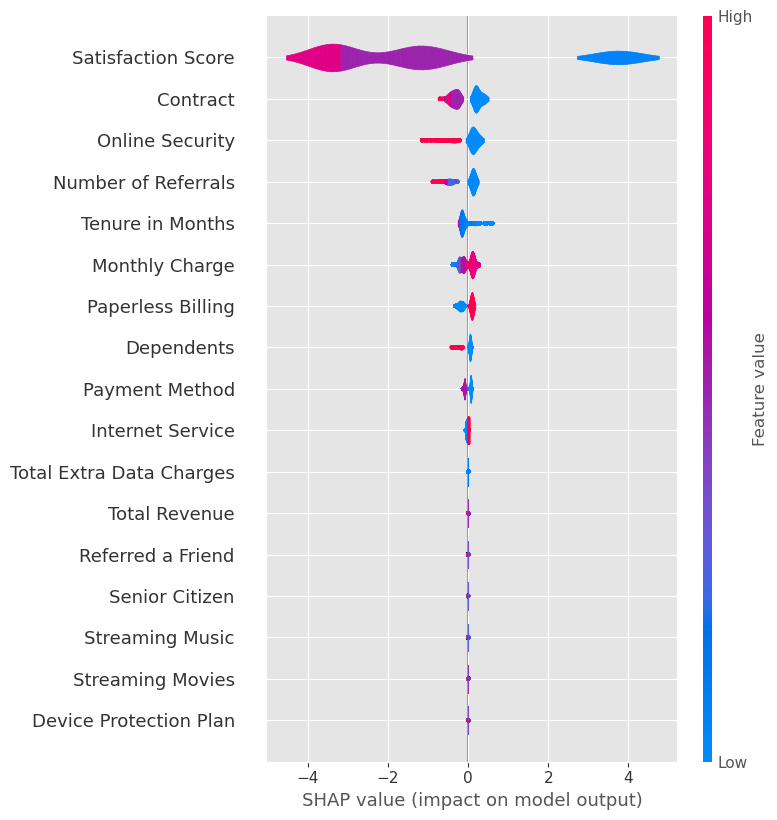

In [198]:
shap.summary_plot(shap_values, X_test, plot_type='violin')